## Лабораторная работа №3

**Типы шумов**

Цифровые изображения, полученные различными оптикоэлектронными приборами, могут содержать в себе разнообразные
искажения, обусловленные разного рода помехами, которые принято называть шумом. Шум на изображении затрудняет его
обработку автоматическими средствами и, поскольку шум может иметь различную природу, для его успешного подавления
необходимо определить адекватную математическую модель. Рассмотрим наиболее распространенные модели шумов.

In [ ]:
import cv2
import skimage
import skimage.filters
import skimage.restoration
import scipy
import scipy.ndimage
import scipy.signal
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
from math import *

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Исходное изображение до наложения шума
image = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/lr3/itmo.jpg"), cv2.COLOR_BGR2GRAY)
print(image.shape)

images_noised = {}

# Общая для всех зашумлённость
amount = 0.2
var = 0.1
mean = 0.0
lam = 12.0

(800, 1200)


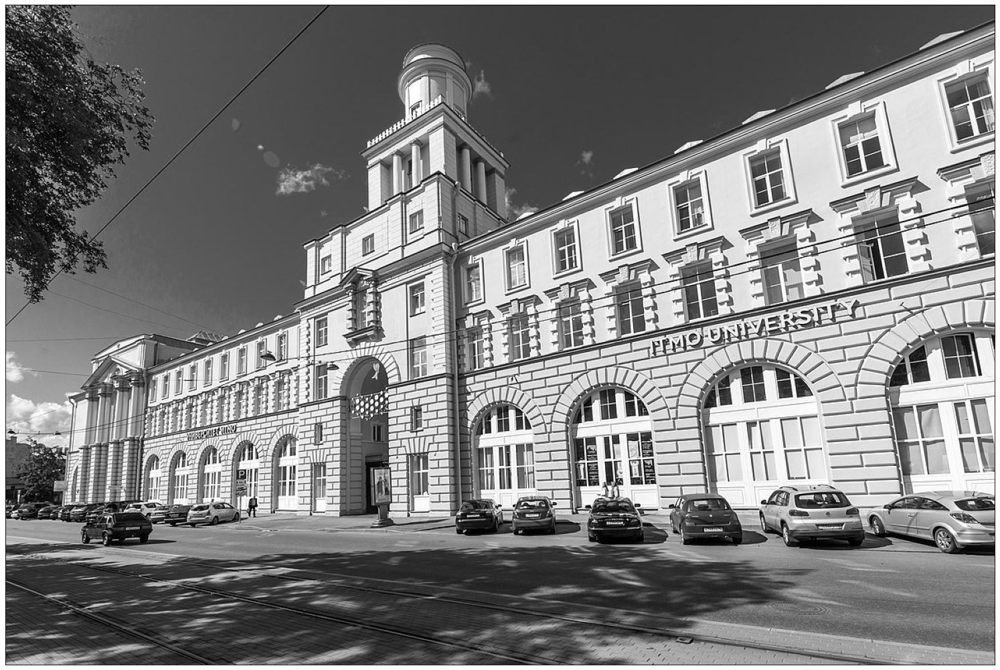

In [ ]:
# Исходное изображение до наложения шума
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

**Импульсный шум**

При импульсном шуме сигнал искажается выбросами с очень
большими отрицательными или положительными значениями малой длительностью и может возникать, например, из-за ошибок
декодирования. Такой шум приводит к появлению на изображении белых («соль») или черных («перец») точек, поэтому зачастую
называется точечным шумом. Для его описания следует принять
во внимание тот факт, что появление шумового выброса в каждом
пикселе 𝐼(𝑥,𝑦) не зависит ни от качества исходного изображения, ни
от наличия шума в других точках и имеет вероятность появления
𝑝, причем значение интенсивности пикселя 𝐼(𝑥,𝑦) будет изменено
на значение 𝑑 ∈ [0,255]

In [ ]:
# Наложение импульсного шума
image_noised_s_and_p = skimage.util.random_noise(image, mode="s&p", amount=amount, salt_vs_pepper=0.3)
image_noised_s_and_p = np.clip(image_noised_s_and_p, 0.0, 1.0)
image_noised_s_and_p = skimage.img_as_ubyte(image_noised_s_and_p)
images_noised["salt and pepper"] = image_noised_s_and_p.copy()

image_noised_all = image_noised_s_and_p

# Изображение после наложения импульсного шума
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_noised_s_and_p, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Output hidden; open in https://colab.research.google.com to view.

**Аддитивный шум**

Аддитивный шум описывается следующим выражением:

𝐼𝑛𝑒𝑤(𝑥,𝑦) = 𝐼(𝑥,𝑦) + 𝜂(𝑥,𝑦),

где 𝐼𝑛𝑒𝑤 — зашумленное изображение,
𝐼 — исходное изображение,
𝜂 — не зависящий от сигнала аддитивный шум с гауссовым или
любым другим распределением функции плотности вероятности.

**Мультипликативный шум**

Мультипликативный шум описывается следующим выражением:

𝐼𝑛𝑒𝑤(𝑥,𝑦) = 𝐼(𝑥,𝑦) · 𝜂(𝑥,𝑦),

где 𝐼𝑛𝑒𝑤 — зашумленное изображение, 𝐼 — исходное изображение, 𝜂
— не зависящий от сигнала мультипликативный шум, умножающий
зарегистрированный сигнал. В качестве примера можно привести
зернистость фотопленки, ультразвуковые изображения и т.д. Частным случаем мультипликативного шума является спекл-шум,
который появляется на изображениях, полученных устройствами с когерентным формированием изображений, например,
медицинскими
сканерами или радарами. На таких изображениях можно отчетливо
наблюдать светлые пятна, крапинки (спеклы), которые разделены
темными участками изображения.

In [ ]:
# Наложение мультипликативного шума
image_noised_multi = skimage.util.random_noise(image, mode="speckle", var=var, mean=mean)
image_noised_multi = np.clip(image_noised_multi, 0.0, 1.0)
image_noised_multi = skimage.img_as_ubyte(image_noised_multi)
images_noised["speckle"] = image_noised_multi.copy()

image_noised_all = skimage.util.random_noise(image_noised_all, mode="speckle", var=var, mean=mean)
image_noised_all = np.clip(image_noised_all, 0.0, 1.0)
image_noised_all = skimage.img_as_ubyte(image_noised_all)

# Изображение после наложения мультипликативного шума
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_noised_multi, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Output hidden; open in https://colab.research.google.com to view.

**Гауссов (нормальный) шум**

Гауссов шум на изображении может возникать в следствие недостатка освещенности сцены, высокой температуры и т.д.
Модель шума широко распространена в задачах низкочастотной фильтрации изображений.

In [ ]:
# Наложение Гауссова шума
image_noised_gaussian = skimage.util.random_noise(image, mode="gaussian", var=var, mean=mean)
image_noised_gaussian = np.clip(image_noised_gaussian, 0.0, 1.0)
image_noised_gaussian = skimage.img_as_ubyte(image_noised_gaussian)
images_noised["gaussian"] = image_noised_gaussian.copy()

image_noised_all = skimage.util.random_noise(image_noised_all, mode="gaussian", var=var, mean=mean)
image_noised_all = np.clip(image_noised_all, 0.0, 1.0)
image_noised_all = skimage.img_as_ubyte(image_noised_all)

# Изображение после наложения Гауссова шума
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_noised_gaussian, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Output hidden; open in https://colab.research.google.com to view.

**Шум квантования**

Зависит от выбранного шага квантования и самого сигнала.
Шум квантования может приводить, например, к появлению ложных контуров вокруг объектов или убирать слабо
контрастные детали на изображении. Такой шум не устраняется. Приближенно
шум квантования можно описать распределением Пуассона

In [ ]:
# Создание шума квантования с заданными параметрами распределения Пуассона
noise_poisson = np.random.poisson(lam=lam, size=image.shape) * (1.0 / 255.0)
noise_poisson = np.clip(noise_poisson, 1.0 / 255.0, 1.0)

# Наложение шума квантования
image_noised_poisson = skimage.util.random_noise(image, mode="localvar", local_vars=noise_poisson)
image_noised_poisson = np.clip(image_noised_poisson, 0.0, 1.0)
image_noised_poisson = skimage.img_as_ubyte(image_noised_poisson)
images_noised["poisson"] = image_noised_poisson.copy()

image_noised_all = skimage.util.random_noise(image_noised_all, mode="localvar", local_vars=noise_poisson)
image_noised_all = np.clip(image_noised_all, 0.0, 1.0)
image_noised_all = skimage.img_as_ubyte(image_noised_all)

# Изображение после наложения шума квантования
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_noised_poisson, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Изображение после наложения всех шумов
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_noised_all, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### 2 Низкочастотная фильтрация

Низкочастотные пространственные фильтры ослабляют высокочастотные компоненты (области с сильным изменением интенсивностей) и оставляют низкочастотные компоненты изображения
без изменений. Используются для снижения уровня шума и удаления высокочастотных компонент, что позволяет повысить точность
исследования содержания низкочастотных компонент. В результате применения низкочастотных фильтров получим сглаженное или
размытое изображение. Главными отличительными особенностями
являются:

1. неотрицательные коэффициенты маски;

2. сумма всех коэффициентов равна единице.

### 2.1 Фильтр Гаусса

salt and pepper
speckle
gaussian
poisson


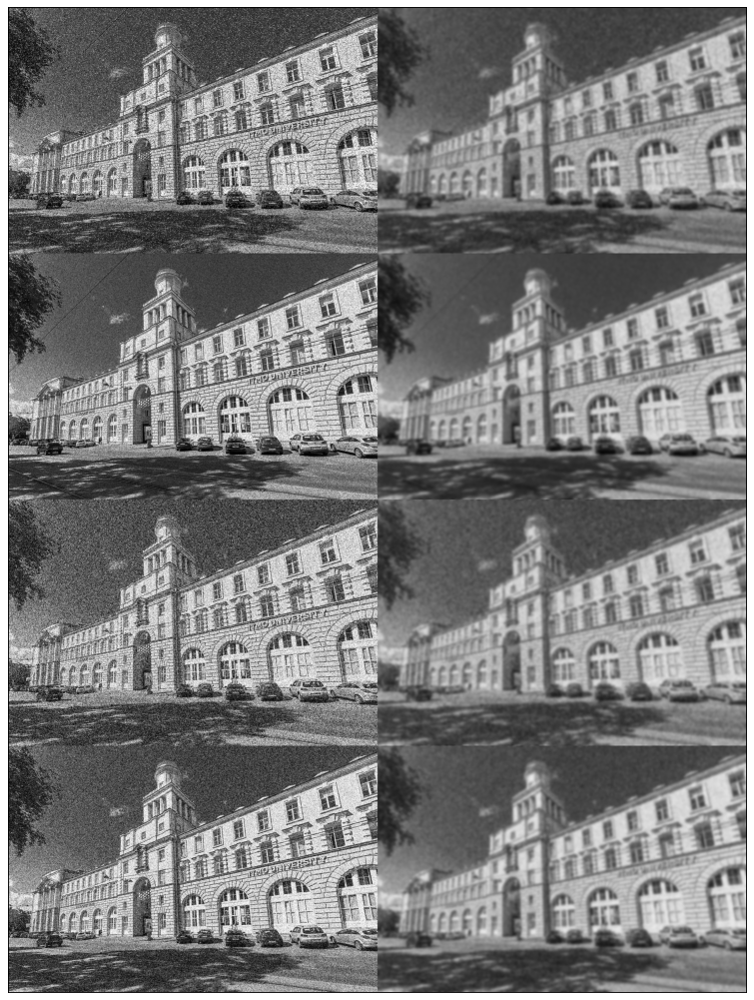

In [ ]:
# Применеие фильтра Гаусса ко всем зашумлённым изображениям
image_combined = None
for image_name in images_noised.keys():
    print(image_name)
    image_filtered = skimage.filters.gaussian(images_noised[image_name], sigma=4.0)
    image_filtered = np.clip(image_filtered, 0.0, 1.0)
    image_filtered = skimage.img_as_ubyte(image_filtered)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

### 2.2 Контргармонический усредняющий фильтр с различными значениями параметра 𝑄

In [ ]:
def counter_harmonic_mean_filter(image, kernel_size=3, Q=0):
    rows, cols = image.shape
    kernel_mid = kernel_size // 2
    kernel_k = 1 / pow(kernel_size, 2.0)

    image_bordered = cv2.copyMakeBorder(
        image,
        top=kernel_size // 2,
        bottom=kernel_size // 2 + kernel_size % 2,
        left=kernel_size // 2,
        right=kernel_size // 2 + kernel_size % 2,
        borderType=cv2.BORDER_REPLICATE,
        value=[mean, mean, mean]
    )

    image_float = np.clip(image / 255.0, 0.0, 1.0)
    image_bordered_float = np.zeros_like(image_bordered, dtype=np.float64)

    image_float_power = []
    for q in range(2):
        image_float_power.append(np.power(image_float, Q + q))
        image_float_power[q] = np.clip(image_float_power[q], 0.0, 10)
    for y in range(-kernel_mid, kernel_mid + kernel_size % 2):
        for x in range(-kernel_mid, kernel_mid + kernel_size % 2):
            image_bordered_float[kernel_mid + y:kernel_mid + rows + y,
            kernel_mid + x:kernel_mid + cols + x] += kernel_k * image_float_power[1] / image_float_power[0]
    image_bordered_float = np.clip(image_bordered_float, 0.0, 1.0)
    image = image_bordered_float[kernel_mid:rows+kernel_mid, kernel_mid:cols+kernel_mid] * 255.0
    return image.astype(np.uint8)

Q = -1.5
salt and pepper, 

<ipython-input-11-e78bc4751033>:21: RuntimeWarning: divide by zero encountered in power
  image_float_power.append(np.power(image_float, Q + q))


speckle, gaussian, poisson, 


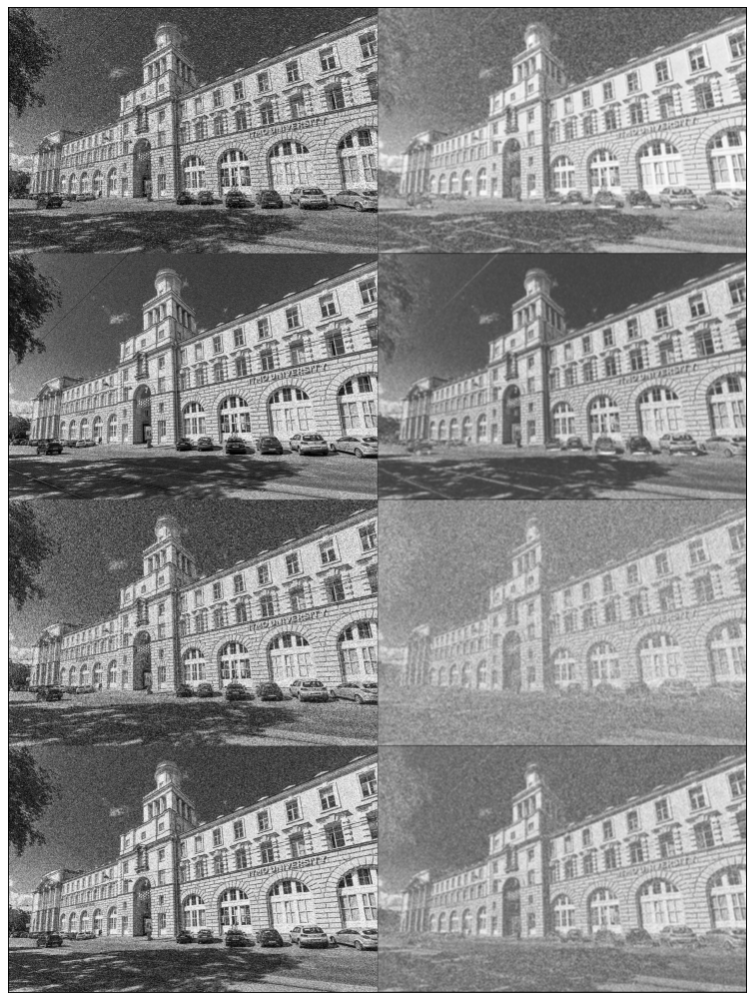

In [ ]:
kernel_size = 7
Q = -1.5
# Применеие Контргармонического усредняющего фильтра с различными значениями параметра 𝑄
# ко всем зашумлённым изображениям
print(f"Q = {Q}")

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = counter_harmonic_mean_filter(images_noised[image_name], kernel_size=kernel_size, Q=Q)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Q = -1.0
salt and pepper, 

<ipython-input-11-e78bc4751033>:21: RuntimeWarning: divide by zero encountered in power
  image_float_power.append(np.power(image_float, Q + q))


speckle, gaussian, poisson, 


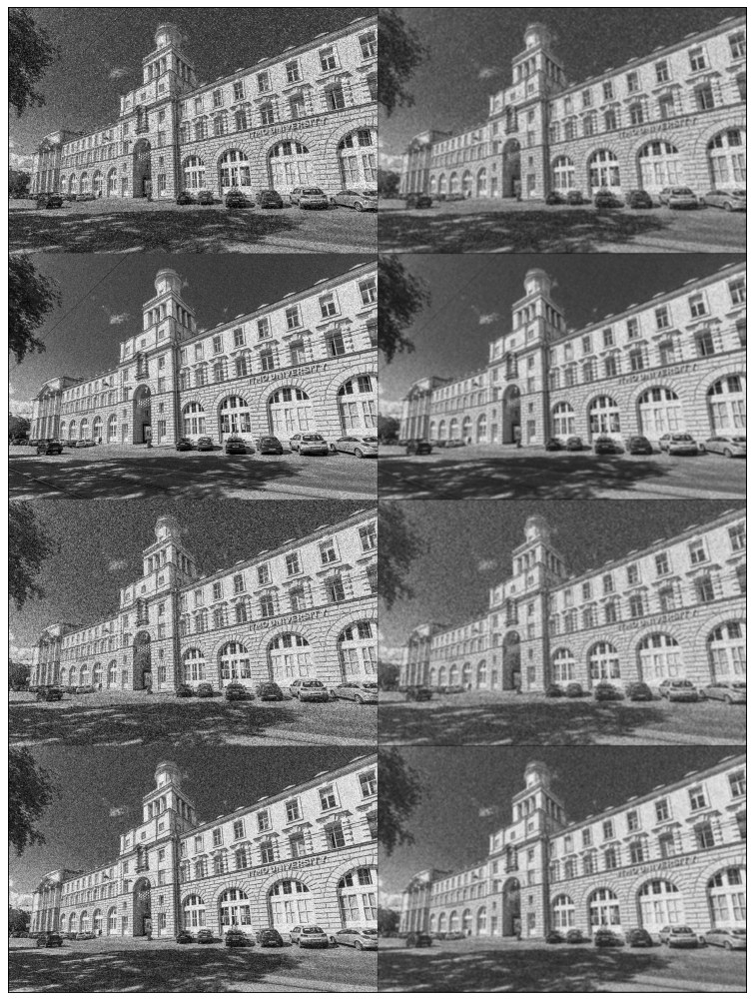

In [ ]:
Q = -1.0
# Применеие Контргармонического усредняющего фильтра с различными значениями параметра 𝑄
# ко всем зашумлённым изображениям
print(f"Q = {Q}")

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = counter_harmonic_mean_filter(images_noised[image_name], kernel_size=kernel_size, Q=Q)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Q = -0.5
salt and pepper, 

<ipython-input-11-e78bc4751033>:21: RuntimeWarning: divide by zero encountered in power
  image_float_power.append(np.power(image_float, Q + q))


speckle, gaussian, poisson, 


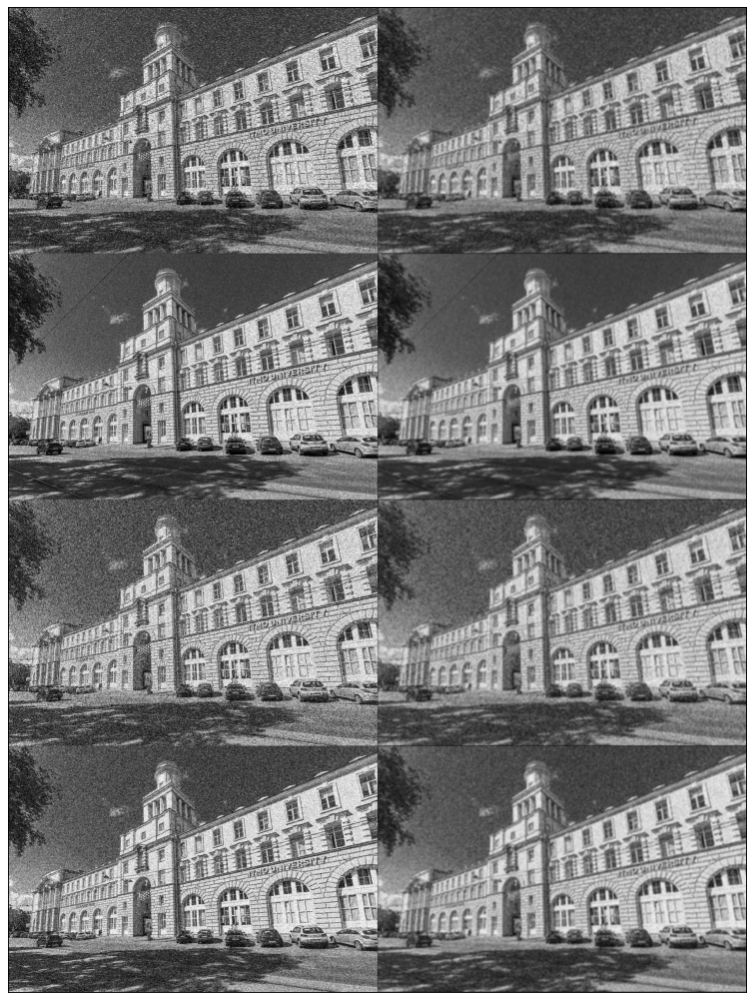

In [ ]:
Q = -0.5
# Применеие Контргармонического усредняющего фильтра с различными значениями параметра 𝑄
# ко всем зашумлённым изображениям
print(f"Q = {Q}")

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = counter_harmonic_mean_filter(images_noised[image_name], kernel_size=kernel_size, Q=Q)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Q = -0.25
salt and pepper, 

<ipython-input-11-e78bc4751033>:21: RuntimeWarning: divide by zero encountered in power
  image_float_power.append(np.power(image_float, Q + q))


speckle, gaussian, poisson, 


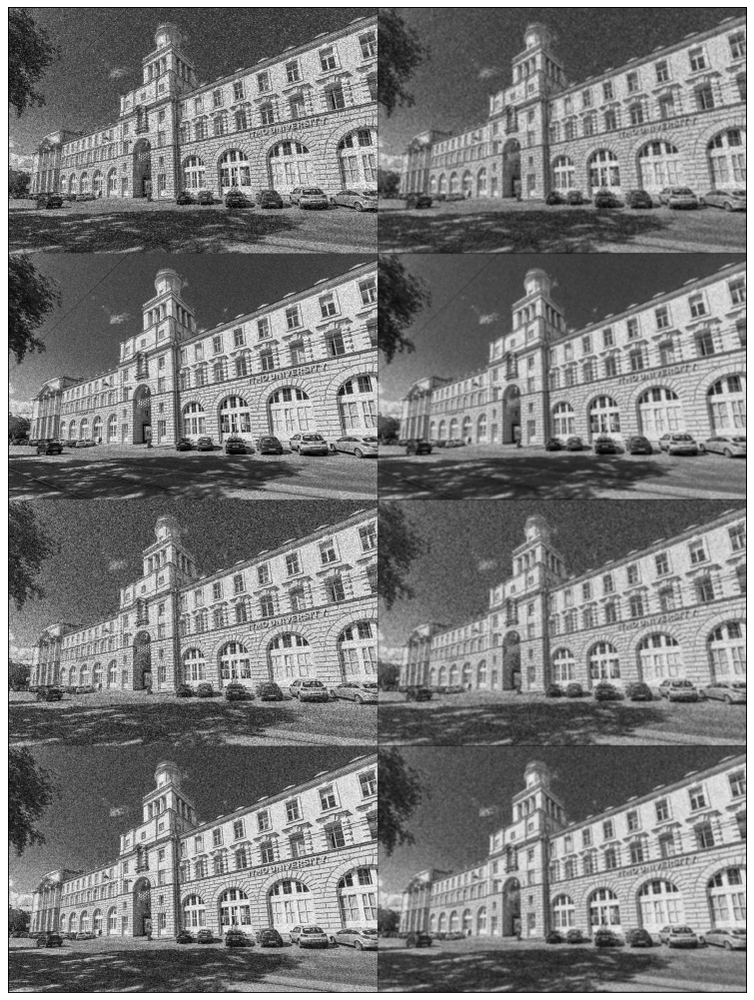

In [ ]:
Q = -0.25
# Применеие Контргармонического усредняющего фильтра с различными значениями параметра 𝑄
# ко всем зашумлённым изображениям
print(f"Q = {Q}")

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = counter_harmonic_mean_filter(images_noised[image_name], kernel_size=kernel_size, Q=Q)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Q = 0.0
salt and pepper, speckle, gaussian, poisson, 


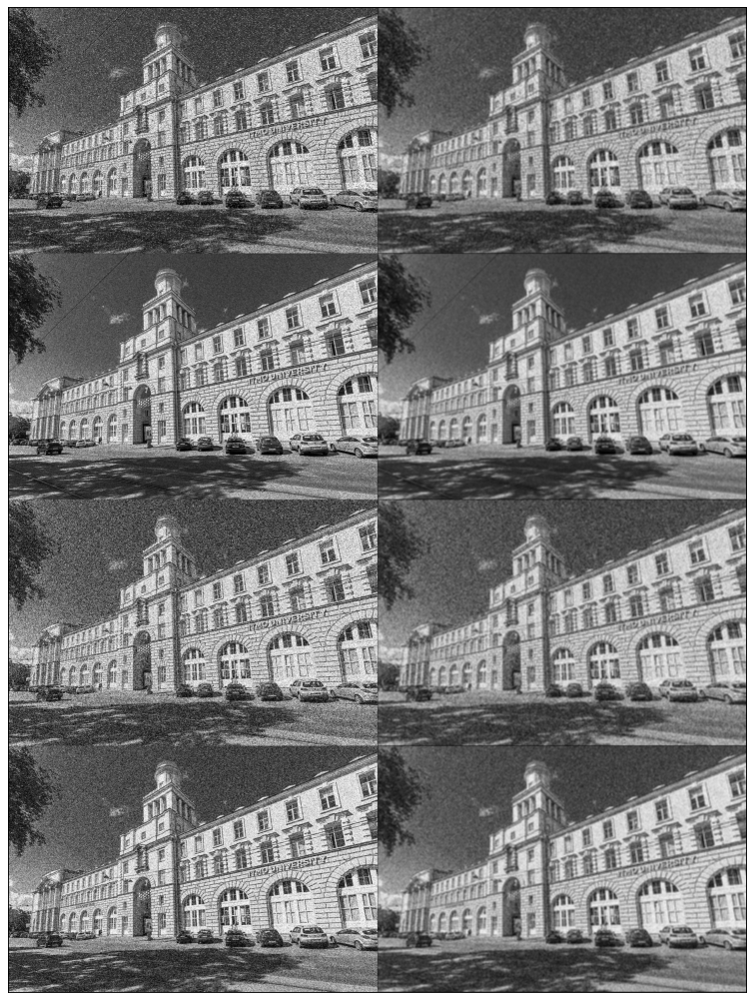

In [ ]:
Q = 0.0
# Применеие Контргармонического усредняющего фильтра с различными значениями параметра 𝑄
# ко всем зашумлённым изображениям
print(f"Q = {Q}")

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = counter_harmonic_mean_filter(images_noised[image_name], kernel_size=kernel_size, Q=Q)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Q = 0.1
salt and pepper, 

<ipython-input-11-e78bc4751033>:26: RuntimeWarning: invalid value encountered in divide
  kernel_mid + x:kernel_mid + cols + x] += kernel_k * image_float_power[1] / image_float_power[0]


speckle, gaussian, poisson, 


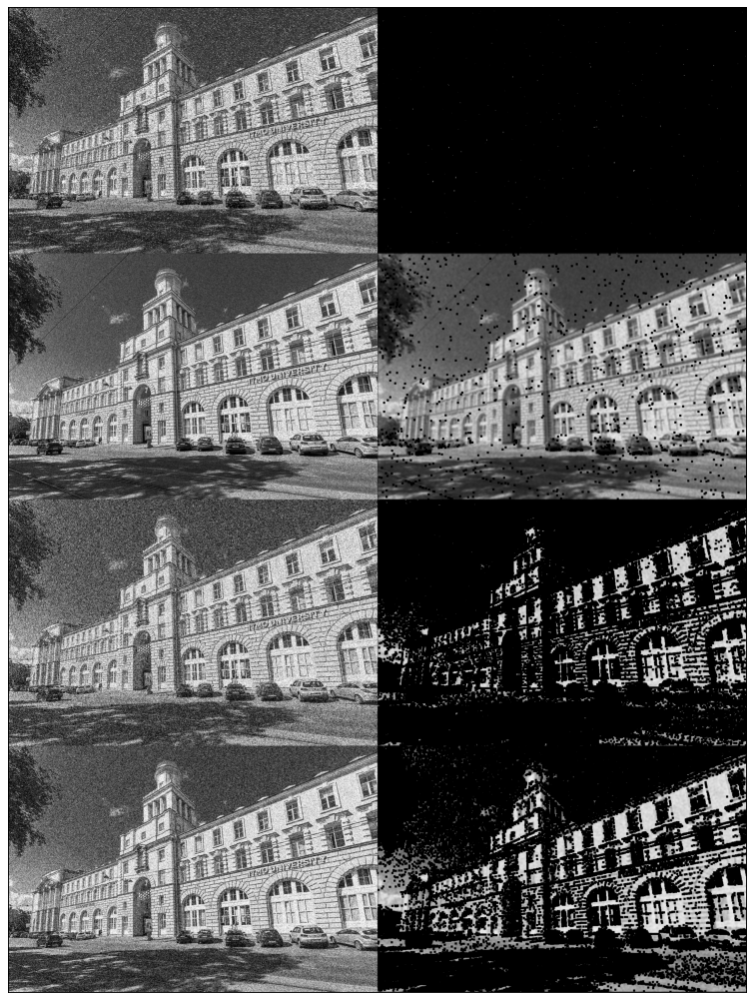

In [ ]:
Q = 0.1
# Применеие Контргармонического усредняющего фильтра с различными значениями параметра 𝑄
# ко всем зашумлённым изображениям
print(f"Q = {Q}")

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = counter_harmonic_mean_filter(images_noised[image_name], kernel_size=kernel_size, Q=Q)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Q = 0.25
salt and pepper, 

<ipython-input-11-e78bc4751033>:26: RuntimeWarning: invalid value encountered in divide
  kernel_mid + x:kernel_mid + cols + x] += kernel_k * image_float_power[1] / image_float_power[0]


speckle, gaussian, poisson, 


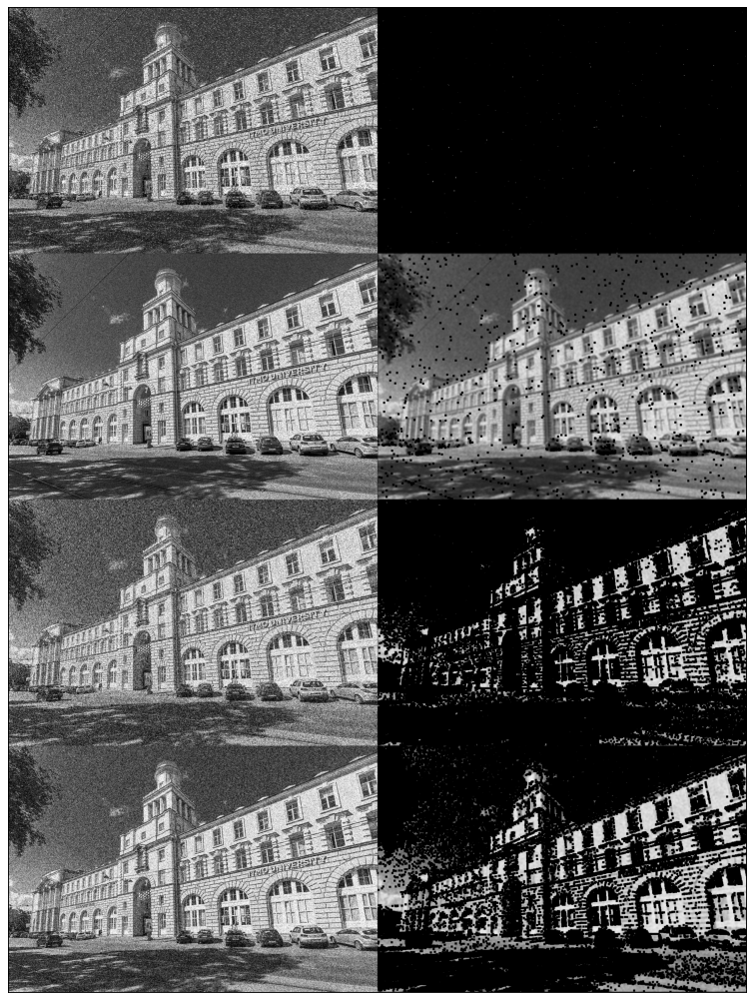

In [ ]:
Q = 0.25
# Применеие Контргармонического усредняющего фильтра с различными значениями параметра 𝑄
# ко всем зашумлённым изображениям
print(f"Q = {Q}")

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = counter_harmonic_mean_filter(images_noised[image_name], kernel_size=kernel_size, Q=Q)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Q = 0.5
salt and pepper, 

<ipython-input-11-e78bc4751033>:26: RuntimeWarning: invalid value encountered in divide
  kernel_mid + x:kernel_mid + cols + x] += kernel_k * image_float_power[1] / image_float_power[0]


speckle, gaussian, poisson, 


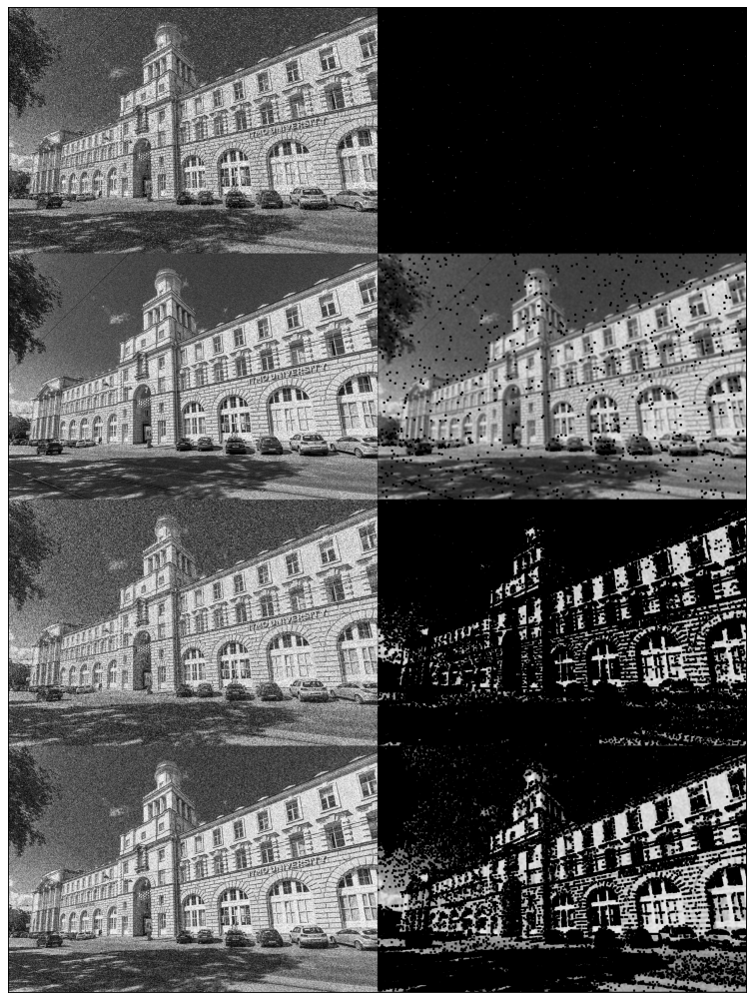

In [ ]:
Q = 0.5
# Применеие Контргармонического усредняющего фильтра с различными значениями параметра 𝑄
# ко всем зашумлённым изображениям
print(f"Q = {Q}")

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = counter_harmonic_mean_filter(images_noised[image_name], kernel_size=kernel_size, Q=Q)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Q = 1.0
salt and pepper, 

<ipython-input-11-e78bc4751033>:26: RuntimeWarning: invalid value encountered in divide
  kernel_mid + x:kernel_mid + cols + x] += kernel_k * image_float_power[1] / image_float_power[0]


speckle, gaussian, poisson, 


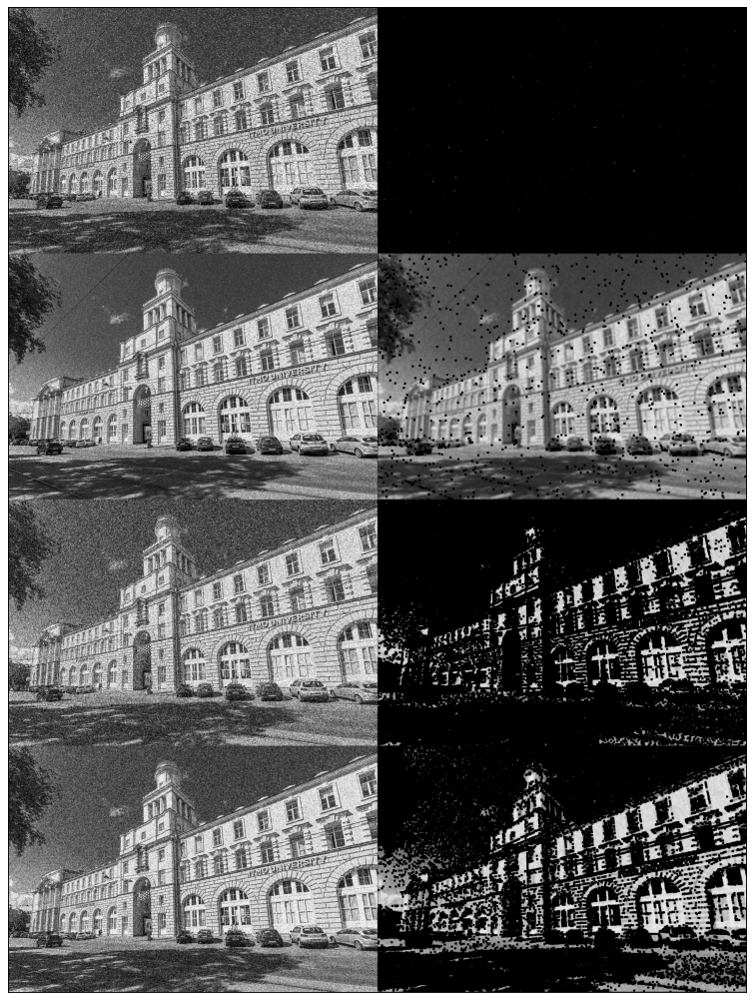

In [ ]:
Q = 1.0
# Применеие Контргармонического усредняющего фильтра с различными значениями параметра 𝑄
# ко всем зашумлённым изображениям
print(f"Q = {Q}")

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = counter_harmonic_mean_filter(images_noised[image_name], kernel_size=kernel_size, Q=Q)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Q = 1.5
salt and pepper, 

<ipython-input-11-e78bc4751033>:26: RuntimeWarning: invalid value encountered in divide
  kernel_mid + x:kernel_mid + cols + x] += kernel_k * image_float_power[1] / image_float_power[0]


speckle, gaussian, poisson, 


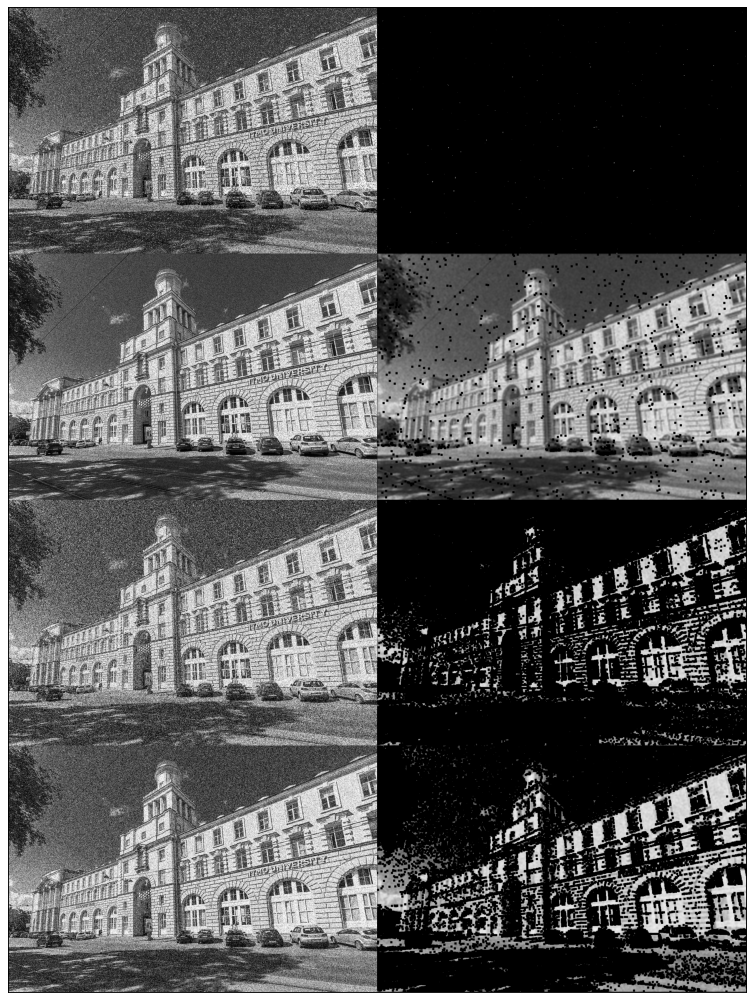

In [ ]:
Q = 1.5
# Применеие Контргармонического усредняющего фильтра с различными значениями параметра 𝑄
# ко всем зашумлённым изображениям
print(f"Q = {Q}")

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = counter_harmonic_mean_filter(images_noised[image_name], kernel_size=kernel_size, Q=Q)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()